# PSF Photometry

# 1. PSF Extraction

### ``ginga``
``ginga`` is an [astropy-affiliated python package](https://www.astropy.org/affiliated/) to quickly look into image data.
* [official web](https://ginga.readthedocs.io/en/stable/)
* For ``ginga``, install using conda: ``conda install ginga -c conda-forge``,
* **or if you want to install the bleeding-edge**, clone ``https://github.com/ejeschke/ginga.git`` and install using ``python setup.py install``.


From ginga, you have to find the FWHM of the stars.


1. Open ginga
2. ``Operation`` --> ``FBrowser`` --> open your FITS file (Here, ``SNUO_STX16803-M11-1-1-20190507-171622-V-60.0.fits``)
3. ``Operation`` --> ``Analysis`` --> ``Pick``
4. Find a star that is (1) not overlap with other (2) bright enough but not saturated. They are not at the center of the image.
5. left click and right click to do "pick" ([See official documentation of Pick](https://ginga.readthedocs.io/en/stable/manual/plugins_local/pick.html))
6. Bottom right panel: ``Settings`` --> set ``Radius`` to 25 pix (since SNUO 1m has too small pixel scale...)
7. Click ``Redo Pick``
8. Top right panel: Select ``Radial``.
9. Check if it is good:
![](./figs/psfpick.png)
10. If not good, select different star.
11. Bottom right panel: ``Report`` --> ``Add Pick``
12. Do this for around 10 stars throughout the image (better if regularly spaced).
13. ``Save table`` with ``.csv`` extension.

From this process, you will see FWHM is roughly 4-5 pixels. I just used 5 pixel, since it is not important to achieve accurate number.

In [1]:
%config InlineBackend.figure_format = 'retina'

In [2]:
fwhm = 5
psf_size = fwhm * 4 + 1

In [3]:
from pathlib import Path
from photutils import DAOStarFinder
from photutils.aperture import CircularAperture as CAp
from photutils.aperture import CircularAnnulus as CAn
from photutils.centroids import centroid_com
from photutils.psf import extract_stars, EPSFBuilder
from photutils.segmentation import make_source_mask

import numpy as np
from matplotlib import pyplot as plt
from matplotlib import rcParams

from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import Table
from astropy.nddata import CCDData, Cutout2D, NDData
from astropy.visualization import simple_norm
from astropy.modeling.fitting import LevMarLSQFitter
from photutils.psf import FittableImageModel
import astroscrappy
import sep


import ysfitsutilpy as yfu
import ysphotutilpy as ypu
import ysvisutilpy as yvu

plt.style.use('default')
rcParams.update({'font.size':12})
    
DATADIR = Path("../data/example/")
LOGPATH = Path("../tmp")  # a temporary output directory
yfu.mkdir(LOGPATH)

In [4]:
fpath = DATADIR/"M3_V_compressed.fits"
hdul = fits.open(fpath)
data_raw = hdul[1].data

print(hdul.info())

gain = hdul[1].header["EGAIN"]
readnoise = hdul[1].header["RDNOISE"]

Filename: ../data/example/M3_V_compressed.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  COMPRESSED_IMAGE    1 CompImageHDU    253   (3192, 2129)   float64   
None


## Background subtraction

Please refer to [SNU_AOclass - SExtractorBackground and sep](https://nbviewer.org/github/ysBach/SNU_AOclass/blob/master/Notebooks/06-1_photutils_SExtractorBackground_and_sep.ipynb)

/var/folders/c3/0f663kw90xldstvklyr5nq9c0000gn/T/ipykernel_47619/2381642779.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  cb.ax.set_xticklabels(cb.get_ticks().astype(int), rotation=45)


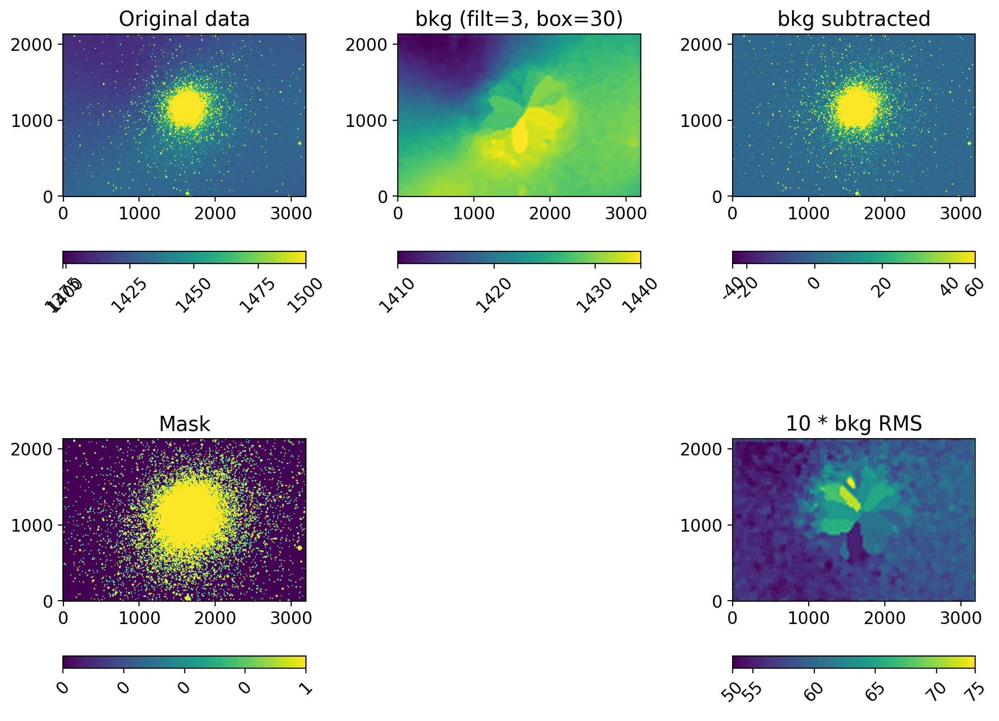

In [5]:
def background_substraction(ccd, box=30, filt=3, show=True):
    mask = make_source_mask(ccd.data, nsigma=2, npixels=3, dilate_size=11)
    bkg_sep = sep.Background(ccd.data, 
                             mask=mask, bw=box, bh=box, fw=filt, fh=filt)
    bkgsub_sep = ccd.data - bkg_sep.back()
    
    if show:
        fig, axs = plt.subplots(2, 3, figsize=(10, 8))
        axs[1, 1].axis("off")
        
        data2plot = [
            dict(ax=axs[0, 0], arr=ccd.data,                      title="Original data"),
            dict(ax=axs[0, 1], arr=bkg_sep.back(),            title=f"bkg (filt={filt:d}, box={box:d})"),
            dict(ax=axs[0, 2], arr=bkgsub_sep,                title="bkg subtracted"),
            dict(ax=axs[1, 0], arr=mask,                      title="Mask"),
        #     dict(ax=axs[1, 1], arr=bkg_sep.background_mesh,   title="bkg mesh"),
            dict(ax=axs[1, 2], arr=10*bkg_sep.rms(),          title="10 * bkg RMS")
        ]
        
        for dd in data2plot:
            im = yvu.norm_imshow(dd['ax'], dd['arr'], zscale=True)
            cb = fig.colorbar(im, ax=dd['ax'], orientation='horizontal')
            cb.ax.set_xticklabels(cb.get_ticks().astype(int), rotation=45)
            dd['ax'].set_title(dd['title'])
        
        plt.tight_layout()
    
    return bkgsub_sep

ccd_raw = CCDData(data_raw, header=hdul[1].header, unit='adu')
bkgsub = background_substraction(ccd_raw, show=True)
ccd_bkgsub = CCDData(bkgsub, header=hdul[1].header, unit='adu')

## CR Rejection
CR rejection is essential for PSF photometry.

In [6]:
crpath = LOGPATH / "M3_V_CR.fits"
try:
    ccd = CCDData.read(crpath)
except FileNotFoundError:
    ccd, crmask = yfu.crrej(
        ccd=ccd_bkgsub,
        gain=gain,
        rdnoise=readnoise,
        objlim=5.,
        sepmed=True,   # IRAF LACosmic is sepmed=False        
    )
    ccd.write(crpath)
data = ccd.data   # CR rejection이 완료된 데이터 자료

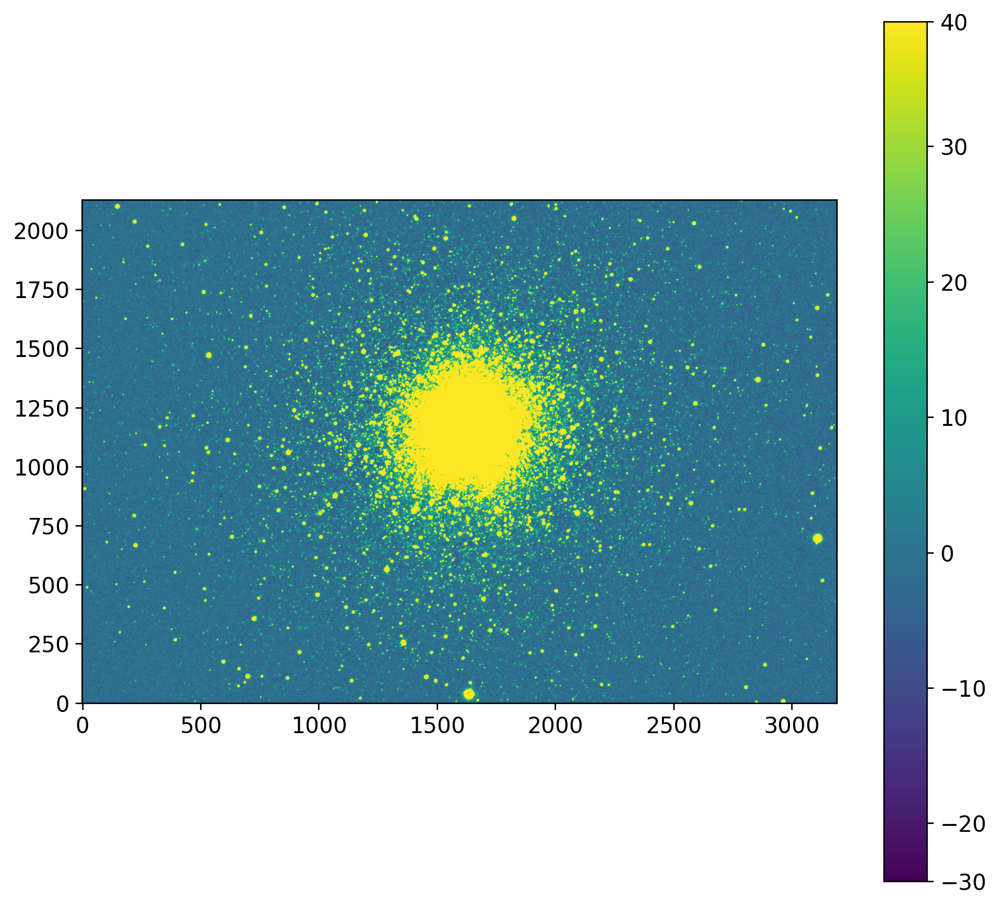

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(8, 7))
im = yvu.norm_imshow(ax, ccd.data, zscale=True)
plt.colorbar(im)
plt.tight_layout()

## Load the ``Pick`` Result

Load the ginga ``Pick`` results, and find the centers of the stars. 

In [8]:
pick_colnames = ['ra_txt','dec_txt','equinox','x','y','fwhm','fwhm_x','fwhm_y',
                 'encircled_energy','ensquared_energy','ee_sampling_radius',
                 'starsize','ellipse','background','skylevel','brightness',
                 'time_local','time_ut','ra_deg','dec_deg']

pick = Table.read(DATADIR/"pick_M3_V.csv", format="ascii.csv", 
                  delimiter=',', data_start=2, comment="#", names=pick_colnames)
pick = Table.read(DATADIR/"pick_M3_V.csv")
# NOTE: ginga pick has 1-indexing: https://github.com/ejeschke/ginga/issues/769
pick["x"] -= 1
pick["y"] -= 1

# Only pixels near the stars in the txt file
mask = np.ones_like(data).astype(bool)   # 1로 이루어진 data 와 같은 형식의 array 만들어냄 
for row in pick:
    pos = (row["x"], row["y"])
    iy, ix = Cutout2D(mask, position=pos, size=psf_size).bbox_original
    mask[iy[0]:iy[1], ix[0]:ix[1]] = False      # 12개 별들의 위치는 False로 바꿔줌 , mask에서 제외

thresh = np.median(data)

print("Finding stars...")
finder = DAOStarFinder(fwhm=fwhm, threshold=thresh, exclude_border=True)
found = finder(data, mask=mask)
print(f"Stars initially selected for the PSF estimation: {len(pick)}")
print(f"Stars found from finder: {len(found)}")
if len(pick) != len(found):
    print("!!!!!! pick and found length not match !!!!!!")

found.remove_columns(["npix", "sky"]) # remove confusing columns from DAOStarFinder



Finding stars...
Stars initially selected for the PSF estimation: 12
Stars found from finder: 12


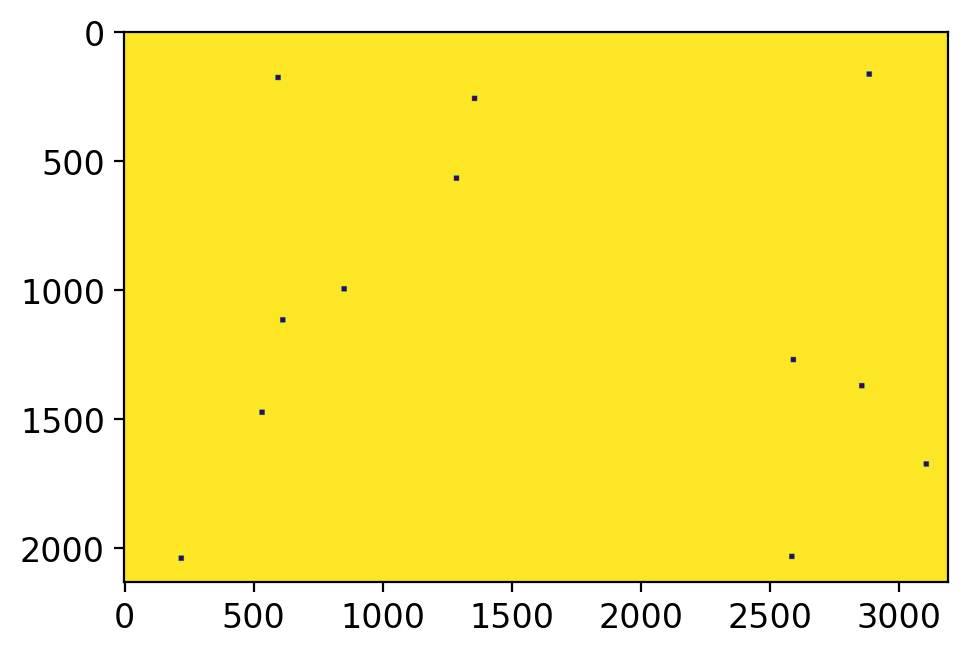

In [9]:
fig, axs = plt.subplots(1, 1, figsize=(5, 6), sharex=False, sharey=False, gridspec_kw=None)
# yvu.zimshow(axs, mask.astype(int))
axs.imshow(mask.astype(int))
plt.tight_layout()

* **NOTE**: You may note that this is extraordinarily slow. The reason is that the ``DAOStarFinder`` calculates convolution, etc, to all the image, although we input ``mask``. For faster calculation, you may use some workaround, e.g., cut the CCD near the star (using ``astropy.nddata.Cutout2D``) and do convolution and centroiding. 

## Crop the Pixels Near the PSF Stars
Crop the image by ``psf_size`` box centering on the PSF stars:

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,peak,flux,mag,x_init,y_init,shift,msky,ssky,nsky,nrej,source_sum
int64,float64,float64,float64,float32,float64,float64,float64,float64,object,object,object,object,object,object,object,object
1,2886.911362597453,163.22852074517,0.5010034559010427,0.21458091,0.0416800129892237,1193.9788818359375,23907.93359375,-10.946355102186779,2886.8924331482476,163.21502472362644,0.023247938504642955,-1.860327959060669,4.653099,1573,15,37069.19949475199
2,597.1391926496434,176.2952697765759,0.492349737284764,0.09355366,0.019929917787252997,1863.8760986328125,37792.171875,-11.443504627663936,597.1178229172218,176.27962285885172,0.026485684775699344,-0.6724808216094971,4.459249,1568,3,57517.619434773515
3,1357.964128004449,256.967979027083,0.5004758783442091,0.15264475,-0.014573411448271407,10969.8369140625,224759.9375,-13.37929725664168,1357.957956239198,256.9630157442152,0.007919902975440282,0.9339520931243896,5.7089634,1564,111,323035.42807627807
4,1288.2686620792374,565.9459019686009,0.5026560544623827,0.09493204,-0.028101015340461378,11191.0771484375,228129.890625,-13.395455480651332,1288.260162238227,565.9326170258649,0.015771398184695855,0.6743520498275757,5.5706143,1569,24,330415.4513661659
5,852.8673945325612,994.1995303988558,0.49412641428705834,-0.0018797258,0.013622490672098263,3271.5380859375,66897.4453125,-12.06352383298949,852.852553271772,994.1928895937538,0.016259253187574686,-1.199618935585022,5.543915,1573,31,98944.83835115677
6,615.2393069400586,1113.75098027962,0.5039545351820512,-0.0701495,0.0002623134489284427,3284.591796875,65892.1171875,-12.047083655349196,615.2234607642695,1113.7538148756287,0.01609770858446479,-0.7958922386169434,4.8039417,1570,10,100587.96144079135
7,2592.9341668632924,1267.9797418807436,0.5070425765932484,0.14775518,-0.0016858977269179193,3520.434326171875,72391.890625,-12.149224797603818,2592.9329371761028,1267.967895422055,0.011910109741021937,-0.909596860408783,5.193339,1567,38,102045.02635654128
8,2857.904705297432,1368.6935819338485,0.5070530894873293,0.16252938,0.017659726993440258,8496.119140625,173437.65625,-13.09785849014721,2857.906620163681,1368.684688905993,0.009096848750552902,0.20887593179941177,4.8690834,1570,10,248880.1774103646
9,535.0125175475623,1472.2832492701614,0.48638631118936043,-0.07692276,0.05027601018933943,9253.6005859375,185573.9375,-13.171292456717902,535.0132489563921,1472.2720705952045,0.01120257705478997,-0.4475376605987549,4.898343,1572,2,293078.5032750734


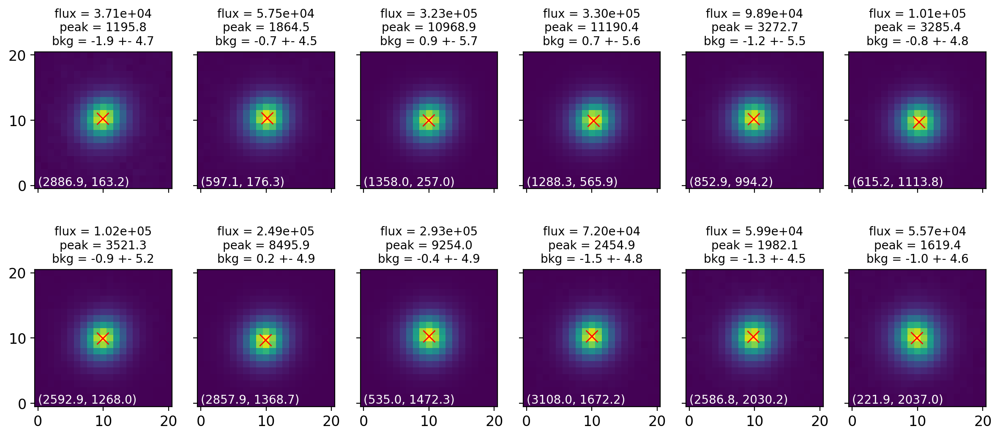

In [10]:
cut4psf = []

ncol = 6
nrow = int(np.ceil(len(found)/ncol))
fig, axs = plt.subplots(nrow, ncol, figsize=(12, 2.8 * nrow), sharex=True, sharey=True)

r_ap = 2 * fwhm
r_in = 4 * fwhm
r_out = 6 * fwhm

# Initialize columns
for c in ["x_init", "y_init", "shift", "msky", "ssky", "nsky", "nrej", "source_sum"]:
    found[c] = None
    
for i, row in enumerate(found):
    matchpick = pick[(abs(pick["x"] - row["xcentroid"]) < 5)
                    & (abs(pick["y"] - row["ycentroid"]) < 5)]    
    row["x_init"] = matchpick["x"][0]
    row["y_init"] = matchpick["y"][0]
    row["shift"] = np.sqrt((row["xcentroid"] - row["x_init"])**2 
                                + (row["ycentroid"] - row["y_init"])**2)
    pos = (row["xcentroid"], row["ycentroid"])   # found 결과를 이용
    ap = CAp(positions=pos, r=r_ap)
    an = CAn(positions=pos, r_in=r_in, r_out=r_out)
    phot = ypu.apphot_annulus(ccd=ccd, aperture=ap, annulus=an, 
                              sky_keys=dict(mode_option="MMM"))
    for c in ["msky", "ssky", "nsky", "nrej", "source_sum"]:
        row[c] = phot[c][0]

    # Figure plotting--------------------------------------------------------
    irow = i // ncol
    icol = i - irow * ncol
    ax = axs[irow, icol]
    pos = (row["xcentroid"], row["ycentroid"])

    cut_orig = Cutout2D(ccd.data, position=pos, size=psf_size)
    cut_skysub = Cutout2D(ccd.data, position=pos, size=psf_size)
    cut_skysub_norm = Cutout2D(ccd.data, position=pos, size=psf_size)
    
    cut_skysub.data = (cut_orig.data - row["msky"])      # data - sky
    cut_skysub_norm.data = cut_skysub.data / row["source_sum"]  # (data-sky) / source_sum
    cut4psf.append(cut_skysub)

    peak_skysub = cut_skysub.data.max()   # sky 빼낸 것에서의 max rkqt
    posstr = f"({row['xcentroid']:.1f}, {row['ycentroid']:.1f})"
    
    # For showing bright star for PSF, it's better to set high vmin, not zscale,
    # because the central structure near the star cneter is important.
    ax.imshow(cut_skysub.data, origin='lower')
    ax.text(0, 0, posstr, fontsize=10, color='w')
    ax.set_title(f"flux = {row['source_sum']:.2e}\n"
                 + f"peak = {peak_skysub:.1f}\n"
                 + f"bkg = {row['msky']:.1f} +- {row['ssky']:.1f}",
                fontsize=10)
    ax.plot(*cut_orig.to_cutout_position(pos), 'rx', ms=10)
    
plt.tight_layout()

found.write(LOGPATH / "psf_01.csv", overwrite=True)
found

## Building the PSF Model

Please refer to [Photutils - Building an effective Point Spread Function](https://photutils.readthedocs.io/en/stable/epsf.html#build-epsf) and [SNU_AOclass - PSF Extraction](https://nbviewer.org/github/ysbach/SNU_AOclass/blob/master/Notebooks/08-PSF_Extraction.ipynb)

Here we just adopt `EPSBuilder` in `photutils`.

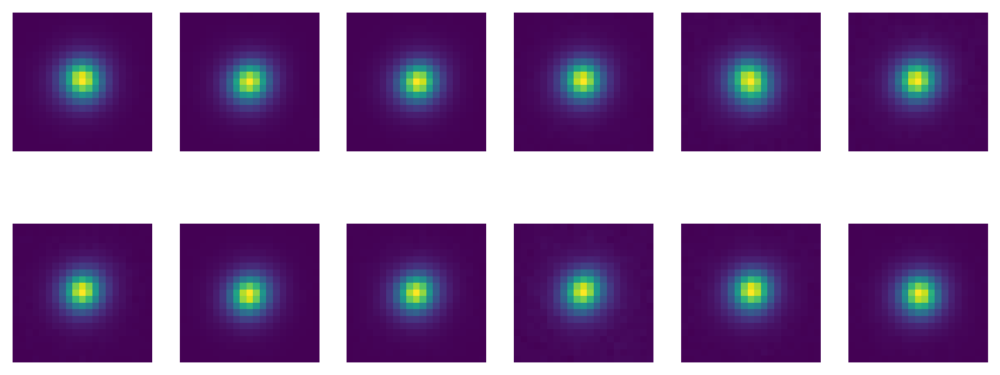

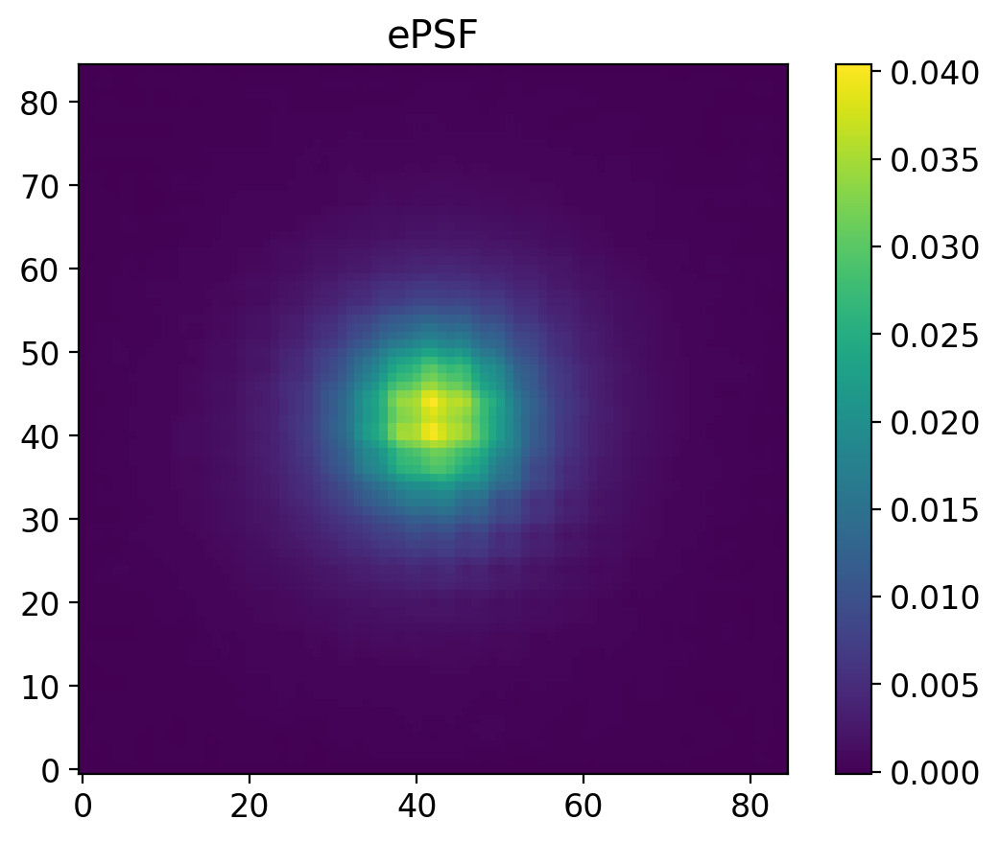

In [11]:
def get_epsf(data, pick, psf_size,
             oversampling=4, maxiters=10, smoothing_kernel='quadratic',
             show=True, ncols=6, figsize=(10, 4)):
    mean_val, median_val, std_val = sigma_clipped_stats(data, sigma=2.)  
    data -= median_val  
    
    nddata = NDData(data=data)  
    
    stars = extract_stars(nddata, pick, size=psf_size)  
    
    if show:
        nrows = int(np.ceil(len(stars)/ncols))
        fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize,
                               squeeze=True)
        axs = axs.ravel()
        for ax in axs:
            ax.axis('off')
        for i in range(len(stars)):
            norm = simple_norm(stars[i], 'log', percent=99.)
#             axs[i].imshow(stars[i], norm=norm, origin='lower', cmap='viridis')
            axs[i].imshow(stars[i], origin='lower', cmap='viridis')
        
    epsf_builder = EPSFBuilder(oversampling=oversampling, maxiters=maxiters,
                               progress_bar=False,
                               smoothing_kernel=smoothing_kernel)  
    epsf, fitted_stars = epsf_builder(stars)  
    
    if show:
        plt.figure()
        norm = simple_norm(epsf.data, 'log', percent=99.)
#         plt.imshow(epsf.data, norm=norm, origin='lower', cmap='viridis')
        plt.imshow(epsf.data, origin='lower', cmap='viridis')
        plt.title('ePSF')
        plt.colorbar()
        
    return epsf

psfmodel = get_epsf(data, pick, psf_size)

## Checking the Residuals

/Users/hbahk/class/ao22/ysphotutilpy/ysphotutilpy/daopsf.py:73: RuntimeWarning: divide by zero encountered in true_divide
  astropy_weight = np.sqrt(dao_weight.data) / fcut_err


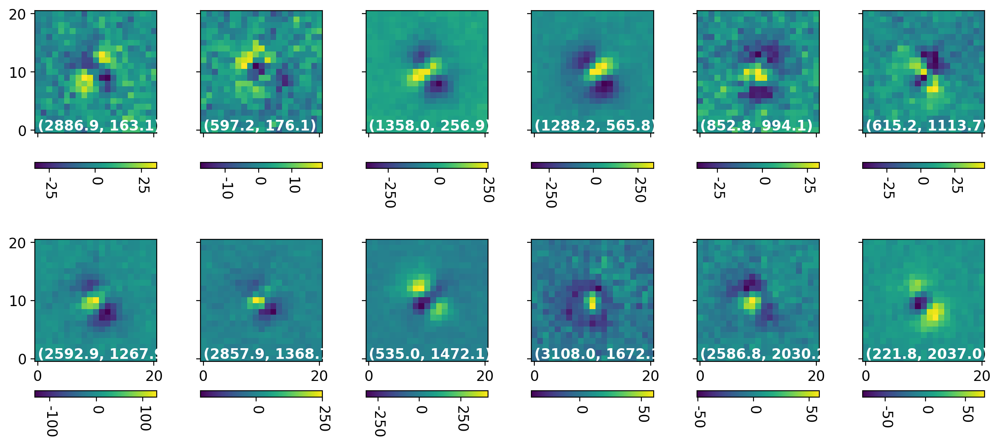

In [12]:
ncol = 6
nrow = int(np.ceil(len(found)/ncol))
fig, axs = plt.subplots(nrow, ncol, figsize=(12, 2.8 * nrow), sharex=True, sharey=True)

for i, cut in enumerate(cut4psf):
    # Figure plotting
    irow = i // ncol
    icol = i - irow * ncol
    row = found[i]
    ax = axs[irow, icol]
    fit, pos_fit, _ = ypu.dao_nstar(cut.data, psf=psfmodel, r_fit=fwhm, 
                                    flux_init=row["source_sum"],
                                    full=False)
    
    yy, xx = np.mgrid[:cut.data.shape[1], :cut.data.shape[0]]
    
    im = ax.imshow(cut.data - fit(xx, yy), origin='lower') # cut = data - sky , fit = psf
    cb = yvu.colorbaring(fig, ax, im)
    
    pos_str = "({:.1f}, {:.1f})".format(*cut.to_original_position(pos_fit))
    ax.text(0, 0, pos_str, fontsize=12, fontweight='bold', color='w')
    plt.setp(cb.ax.get_xticklabels(),rotation=-90)
    
plt.tight_layout()

* **NOTE**: 이미지의 위치에 따라서 PSF의 모양이 달라질 수 있는데, PSF 모델링을 위해 고른 별들의 플럭스 분포를 보면 각기 다른 방향으로 기울어진 것을 확인할 수 있다. 이 기울어진 방향에따라 별마다 residual image가 완전히 0이 되지 않고 패턴을 보이게 된다. 

In [13]:
psfccd = CCDData(data=psfmodel.data, unit='adu')
psfccd.header["OVERSAMP"] = (4, "oversampling factor")
psfccd.header["FWHM"] = (fwhm, "The crude FWHM of the stars")
psfccd.header["PSFSIZE"] = (psf_size, "The PSF size")
psfccd.write(LOGPATH / "psf_01.fits", overwrite=True)

# 2. PSF Fitting & Photometry

Here I benchmarked the DAOPHOT (originally called DAOPHOT II) by P. B. Stetson, which is implemented to [IRAF's psf noao.digiphot.daophot](http://stsdas.stsci.edu/cgi-bin/gethelp.cgi?psf).


In [14]:
PSFPATH = Path("../tmp/psf_01.fits")
PHOTPSFPATH = Path("../tmp/psf_01.csv")   # found info
DATAPATH = LOGPATH / "M3_V_CR.fits"
FITTER = LevMarLSQFitter()

# PSF data----------------------------------------------------------------
phot_psf = Table.read(PHOTPSFPATH)
psfccd = yfu.load_ccd(PSFPATH)
psfhdr = psfccd.header
PSF_OVERSAMPLE = psfhdr["OVERSAMP"]
psf_init = FittableImageModel(data=psfccd.data,
                              oversampling=PSF_OVERSAMPLE,
                              normalize=True,
                              ikwargs={"degree":[3, 3], "s":0})

fwhm = psfhdr["FWHM"]
psf_size = psfhdr["PSFSIZE"]
r_fit = fwhm # max(2, min(fwhm, 5))

# Target data------------------------------------------------------------
ccd = yfu.load_ccd(DATAPATH)
hdr = ccd.header
err = yfu.errormap(ccd, gain_epadu=hdr["EGAIN"], rdnoise_electron=hdr["RDNOISE"])
data = ccd.data

ccd.uncertainty = err

INFO: array provided for uncertainty; assuming it is a StdDevUncertainty. [astropy.nddata.ccddata]


## Test Initial PSF Stars

In [15]:
# sample data test
cuts = dict(cut=[], err=[], fit=[])


for row in phot_psf:
    pos = (row["xcentroid"], row["ycentroid"])        
#     pos_cut = cut.to_cutout_position(pos)
    scut = Cutout2D(data, position=pos, size=3 * psf_size)  # "subtraction" cut

    result = ypu.dao_nstar(data=scut.data, 
                           position=scut.to_cutout_position(pos), 
                           r_fit=r_fit, 
                           psf=psf_init,
                           flux_init=row["source_sum"], 
                           sky=row["msky"], 
                           err=err, 
                           full=True)
    fit, pos_fit, fitter, astropy_weight, fcut, fcut_skysub, fcut_err = result

    yy_sub, xx_sub = np.mgrid[:scut.data.shape[1], :scut.data.shape[0]]
    star = fit(xx_sub, yy_sub)  # psf model 에 맞춘 각각의 별
    
    cuts["cut"].append(scut)
    cuts["err"].append(fcut_err)
    cuts["fit"].append(star)

cuts_tab = Table(cuts)

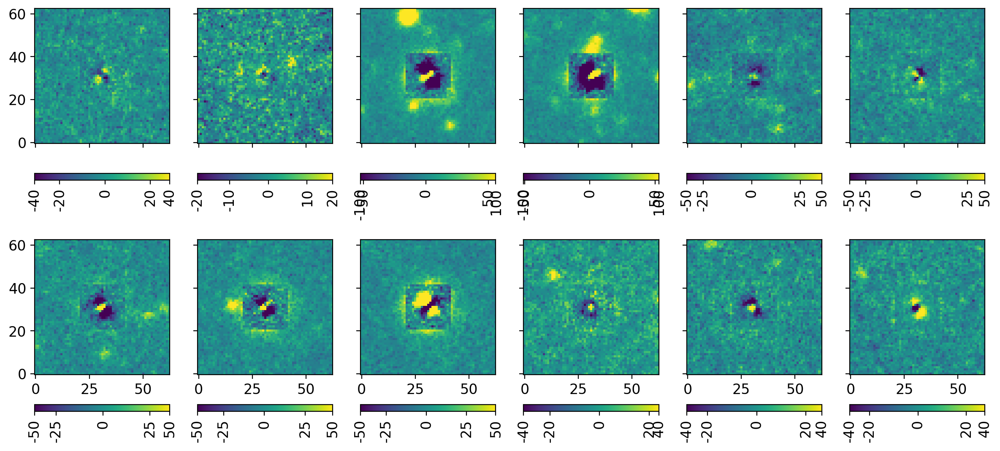

In [16]:
ncol = 6
nrow = int(np.ceil(len(found)/ncol))

fig, axs = plt.subplots(nrow, ncol, figsize=(12, 2.8 * nrow), sharex=True, sharey=True)

for i, row in enumerate(cuts_tab):
    # Figure plotting
    irow = i // ncol
    icol = i - irow * ncol
    ax = axs[irow, icol]
#     posstr = f"({row['xcentroid']:.1f}, {row['ycentroid']:.1f})"
    
    # For showing bright star for PSF, it's better to set high vmin, not zscale,
    # because the central structure near the star cneter is important.
    im = yvu.norm_imshow(ax, row["cut"].data - row["fit"], zscale=True)
    cb = yvu.colorbaring(fig, ax, im)
    plt.setp(cb.ax.get_xticklabels(),rotation=90)
    
plt.tight_layout()



Although not perfectly satisfactory, I will proceed the PSF photometry using this initial PSF. If you want better results, you should do the following:

1. For each PSF stars above, you may see some nearby stars after this initial star subtraction. 
2. Using our initial PSF (say PSF_01), fit PSF_01 to the nearby fainter stars.
3. Subtract the fitted profile.
4. Use this nearby-star-subtracted image to get the PSF as we did in the previous notebook.
5. Get PSF_02
6. Redo these until you are satisfied.

(same as [IRAF psf](http://stsdas.stsci.edu/cgi-bin/gethelp.cgi?psf))

Although PSF_01 will be different from the true PSF (PSF_0), the difference (PSF_0 - PSF_01) will be large only at the wing part, not the core part. The stars nearby our PSF stars must be much fainter than our PSF stars, and thus the contribution of their wing must be small compared to the PSF stars' core parts. This is why we can proceed the iteration by subtracting the nearby star using PSF_01, not PSF_0. 

In [17]:
err = yfu.errormap(ccd, gain_epadu=hdr["EGAIN"], rdnoise_electron=hdr["RDNOISE"])
data = ccd.data

avg, med, std = sigma_clipped_stats(data, sigma=3, maxiters=10, std_ddof=1)
threshold = med + 5 * std     # 5 sigma detection threshold
print(avg, med, std, threshold)

# finder 이용하여 이미지 내 모든 별들 찾기---------------------------------------------
finder = DAOStarFinder(fwhm=fwhm, threshold=threshold,
                       sharplo=0., sharphi=2.0,   # default values 0.2 and 1.0
                       roundlo=-1.0, roundhi=1.0,  # default values -1 and +1
                       sigma_radius=2.5,           # default values 1.5
                       ratio=1.0,                  # 1.0: circular gaussian
                       exclude_border=True)        # To exclude sources near edges

# The DAOStarFinder object ``finder`` gets at least one input: the image.
# Then it returns the astropy table which contains the aperture photometry results:
found = finder(data)

# Select only the stars NOT at the edges (bezel) of the image
found = found[(found["xcentroid"] > psf_size)
             & (found["xcentroid"] < ccd.header["NAXIS1"] - psf_size)
             & (found["ycentroid"] > psf_size)
             & (found["ycentroid"] < ccd.header["NAXIS2"] - psf_size)]

# This needs to be updated by photutils....
found["id"] = np.arange(len(found)) + 1  

star_groups = ypu.group_stars(table=found,
                              crit_separation=2.8 * fwhm, 
                              xcol="xcentroid",
                              ycol="ycentroid",
                              index_only=False)

-0.30515012 -0.6028261 5.4214725 26.504536628723145


* **QUESTION**: See what error you will get if you comment out the line ``found["id"] = np.arange(len(found)) + 1``.

5144 star groups out of 10806 stars


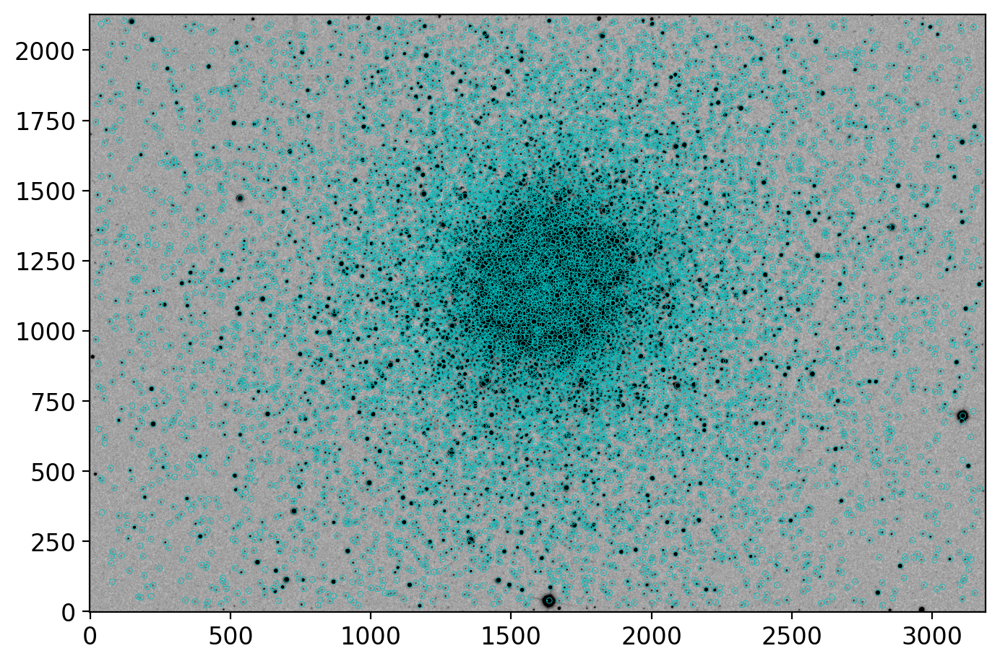

<Figure size 640x480 with 0 Axes>

In [18]:
coords_SF =np.transpose([found['xcentroid'], found['ycentroid']])
#coords_SF = (found['xcentroid'], found['ycentroid'])  # 찾은 별들의 x,y 좌표
ap_found = CAp(coords_SF, r=10) 

print(f"{len(star_groups.groups)} star groups out of {len(star_groups)} stars")

fig, axs = plt.subplots(1, 1, figsize=(8, 8), sharex=False, sharey=False, gridspec_kw=None)
yvu.norm_imshow(axs, data, cmap="gray_r", zscale=True)

for i, group in enumerate(star_groups.groups):
    xypos = np.transpose([group['x_0'], group['y_0']])
    ap = CAp(xypos, r=10)
    ap.plot(color='c', lw=0.3)
plt.show()

plt.tight_layout()

In [19]:
r_fit = 5 # max(2, min(fwhm, 5))
fbox = 2 * r_fit + 1 # fitting box size
r_in = 4 * fwhm
r_out = 6 * fwhm

xypos = np.transpose([star_groups['x_0'], star_groups['y_0']])
# xypos = np.array([star_groups['x_0'], star_groups['y_0']]).T
print(xypos)

ap = CAp(xypos, r=r_fit)
print(ap)
an = CAn(xypos, r_in=r_in, r_out=r_out)
phot = ypu.apphot_annulus(ccd, aperture=ap, annulus=an, error=err)#,
                          #sky_keys={"mode_option":"MMM"})
phot["group_id"] = star_groups["group_id"]
phot = Table.from_pandas(phot)

[[ 955.69207727   21.31669004]
 [ 415.1903645    22.92361801]
 [ 419.29729798   34.58947891]
 ...
 [1015.97054849 2106.91772889]
 [1096.78847237 2107.86498173]
 [1455.72618565 2107.78992891]]
Aperture: CircularAperture
positions: [[ 955.69207727,   21.31669004],
            [ 415.1903645 ,   22.92361801],
            [ 419.29729798,   34.58947891],
            ...,
            [1015.97054849, 2106.91772889],
            [1096.78847237, 2107.86498173],
            [1455.72618565, 2107.78992891]]
r: 5.0


/Users/hbahk/class/ao22/ysphotutilpy/ysphotutilpy/apphot.py:276: RuntimeWarning: invalid value encountered in log10
  phot["mag"] = -2.5*np.log10(phot['source_sum']/t_exposure)


In [20]:
phot

id,xcenter,ycenter,aperture_sum,aperture_sum_err,msky,ssky,nsky,nrej,aparea,source_sum,source_sum_err,mag,merr,snr,bad,nbadpix,group_id
int64,float64,float64,float64,float64,float64,float32,int64,int64,float64,float64,float64,float64,float64,float64,int64,int64,int64
1,955.6920772711863,21.316690040370325,176.65687251527171,15.805049550841519,-0.9851125478744507,4.930069,1343,4,78.53981633974483,254.02743109930915,47.6486389972979,-0.3740202781205021,0.2036545905414115,5.331263105200439,0,0,1
2,415.19036449503824,22.923618008426246,442.1015533879616,16.63561760870226,-0.9851125478744507,4.930069,1343,4,78.53981633974483,519.4721119719991,47.930543291446504,-1.1507243304406822,0.1001784792020855,10.838018438749932,0,0,2
3,419.2972979822633,34.58947891051583,315.7689085672991,16.12296554501539,-0.9851125478744507,4.930069,1343,4,78.53981633974483,393.13946715133653,47.75503350387283,-0.8481853489902219,0.13188543294899752,8.232419460441877,0,0,2
4,1176.0744899244703,21.5357148390522,9489.480933951987,39.485527390180245,-0.9851125478744507,4.930069,1343,4,78.53981633974483,9566.851492536025,59.83059485138801,-4.3137413182566,0.006790138117336588,159.8989867357818,0,0,3
5,2824.043094926825,22.52934020826258,167.50869480275242,15.569222611658706,-0.9851125478744507,4.930069,1343,4,78.53981633974483,244.87925338678986,47.57093545140402,-0.3341987184150734,0.21091818191809142,5.147665293169307,0,0,4
6,812.5679087593645,23.052648974832103,84.79515386504113,15.355199113201977,-0.9851125478744507,4.930069,1343,4,78.53981633974483,162.16571244907857,47.50131942163651,0.11328367673075371,0.3180321011819678,3.4139201694514036,0,0,5
7,2322.7749109267547,23.866543571120655,646.6472899551248,17.46874137024615,-0.9851125478744507,4.930069,1343,4,78.53981633974483,724.0178485391623,48.22603168467018,-1.511191918710161,0.07231969310909453,15.01300901706389,0,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10800,2446.7897407363157,2104.6615043319734,696.3491970393094,17.720785361280278,-0.9851125478744507,4.930069,1343,4,78.53981633974483,773.7197556233468,48.317899797185184,-1.5832779521745106,0.06780296453127874,16.013108162214053,0,0,5138


## Extract Using PSF

In [21]:
from IPython.display import clear_output

stars_01 = dict(id=[], group_id=[], x=[], y=[], flux=[])
data_staronly = np.zeros_like(data)
xx_all, yy_all = np.mgrid[:data_staronly.shape[1], :data_staronly.shape[0]]

phot_g = phot.group_by("group_id")
for i, group in enumerate(phot_g):
    clear_output(wait = True)
    if i % 10 == 0:
        print(f"PSF... {i} ~ {i + 10} / {len(phot_g)}")
    
    group = Table(group)
    sky = np.mean(group["msky"])  # use avg sky; see comment below.
    for row in group:
        pos_init = np.transpose([row["xcenter"], row["ycenter"]])
        result = ypu.dao_nstar(data=data, position=pos_init, r_fit=r_fit, psf=psf_init,
                               flux_init=row["source_sum"], sky=sky, err=err, full=True)
        fit, pos_fit, fitter, astropy_weight, fcut, fcut_skysub, fcut_err = result
        
        try:
            scut = Cutout2D(data, position=pos_fit, size=psf_size, mode='partial')  # "subtraction" cut
            
            stars_01["id"].append(row["id"])
            stars_01["group_id"].append(row["group_id"])
            stars_01["x"].append(pos_fit[0])
            stars_01["y"].append(pos_fit[1])
            stars_01["flux"].append(fit.flux.value)
            
            fit.x_0, fit.y_0 = scut.to_cutout_position(pos_fit)
        
            yy_sub, xx_sub = np.mgrid[:psf_size, :psf_size]
            star = fit(xx_sub, yy_sub)
            data_staronly[scut.slices_original] += star  # cut 위치 빈 상자(slices_original)에 찾은 별들의 정보를 업데이트
        except:
            print(pos_fit)#, sep='\r')


In [23]:
stars_01_tab = Table(stars_01)
stars_01_tab.write("../tmp/psfphot_01.csv", overwrite=True)
stars_01_tab

id,group_id,x,y,flux
int64,int64,float64,float64,float64
1,1,955.9114077804721,21.381397934386502,6897.922095314855
2,2,415.32561647915986,22.86891350113958,9016.711982907993
3,2,419.3143144997725,34.782377507006736,7524.738899510529
4,3,1176.0678834429032,21.55013593999726,182822.29995321465
5,4,2824.062171638649,22.486005369066714,5322.890663219169
6,5,812.5840193756716,23.212958535229262,4421.051782643816
7,6,2322.670782867494,23.697935153572736,14944.365184833356
...,...,...,...,...
10800,5138,2446.77147298996,2104.6946014626596,16161.306920784158


## Investigate Substar

815.836537945167

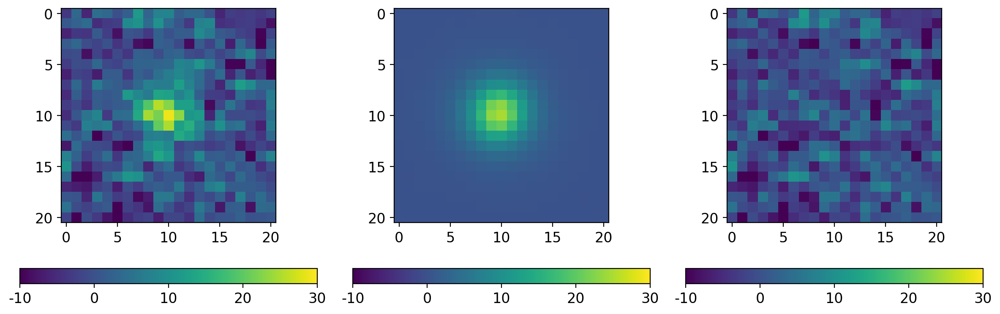

In [24]:
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharex=False, sharey=False, gridspec_kw=None)
vv = dict(vmin=-10, vmax=30)
im = axs[0].imshow((scut.data - sky), **vv)
yvu.colorbaring(fig, axs[0], im)
im = axs[1].imshow(fit(xx_sub, yy_sub), **vv)
yvu.colorbaring(fig, axs[1], im)
im = axs[2].imshow(scut.data - sky - fit(xx_sub, yy_sub), **vv)
yvu.colorbaring(fig, axs[2], im)

plt.tight_layout()

np.sum(fit(xx_sub, yy_sub))

Stetson 1987 PASP 99 191 p.206:
> Thus it is clear that, for these frames at least, solving explicitly for the local diffuse sky brightness produces consistently more photometric scatter at the cost of greater effort than simply adopting the modal value found in a surrounding annulus of pixels, even though the latter method is fundamentally wrong.

For IRAF implementation:
* [psf](http://stsdas.stsci.edu/cgi-bin/gethelp.cgi?psf): manual of "how to psf"
* [daopars](http://stsdas.stsci.edu/cgi-bin/gethelp.cgi?daopars): weighting function implementation



Text(0.5, 1.0, 'Original')

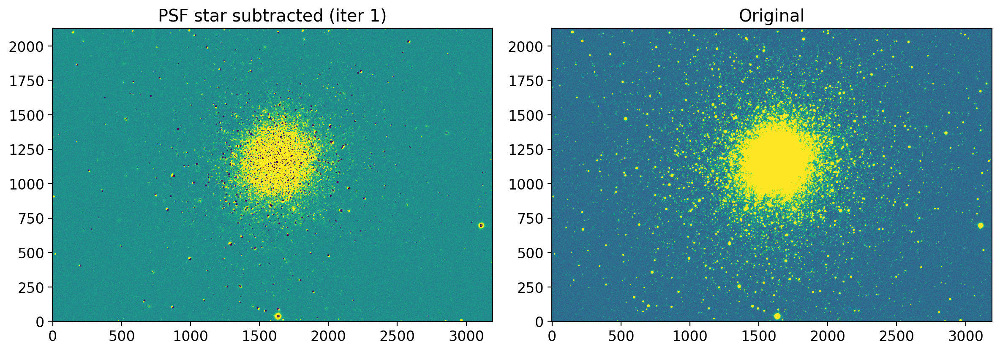

In [25]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharex=False, sharey=False, gridspec_kw=None)
yvu.norm_imshow(axs[0], data - data_staronly, zscale=True)
yvu.norm_imshow(axs[1], data, zscale=True)
# axs[1].imshow(data / (data - data_staronly), vmin=-2, vmax=+2)
# axs[0].plot(phot["xcenter"], phot["ycenter"], 'ro', mfc='none')
# axs[1].plot(phot["xcenter"], phot["ycenter"], 'ro', mfc='none')
plt.tight_layout()

axs[0].set_title("PSF star subtracted (iter 1)")
axs[1].set_title("Original")

## Test Plot for a Star

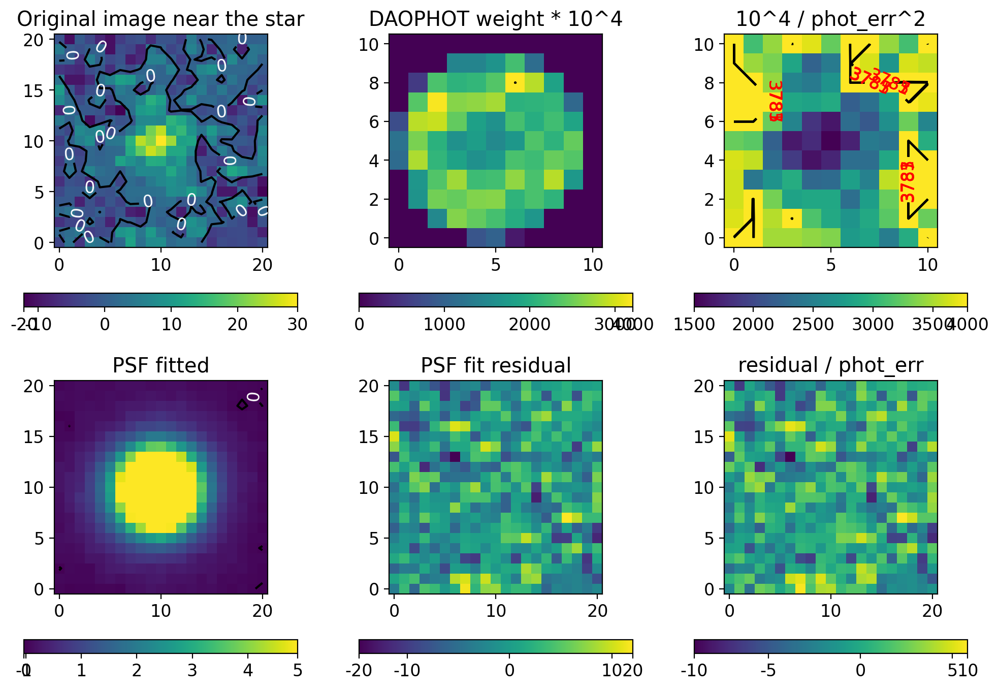

In [26]:
model_fitted = fit(xx_sub, yy_sub)
scut_skysub = scut.data - sky
scut_err = Cutout2D(err, position=pos_fit, size=psf_size).data
residual = scut_skysub - model_fitted

fig, axs = plt.subplots(2, 3, figsize=(10, 7), sharex=False, sharey=False, gridspec_kw=None)
axo = axs[0, 0]  # original
axd = axs[0, 1]  # DAOphot weight
d = 1.e+4 * astropy_weight**2
axp = axs[0, 2]  # phot error
p = 1.e+4 / fcut_err**2
axf = axs[1, 0]  # fit
axr = axs[1, 1]  # residual
ax1 = axs[1, 2]  # residual / phot err

im = yvu.norm_imshow(axo, scut_skysub, zscale=True)
cs = axo.contour(scut_skysub, colors='k', levels=np.arange(0, 1000, 200))
axo.clabel(cs, inline=1, colors='w', fmt="%.0f")
axo.set_title("Original image near the star")
yvu.colorbaring(fig, axo, im)

im = yvu.norm_imshow(axd, d, zscale=True)
cs = axd.contour(d, colors='k', levels=np.arange(d.max() - 7, d.max()+3, 2))
axd.clabel(cs, inline=1, colors='r', fmt="%.0f")
axd.set_title("DAOPHOT weight * 10^4")
yvu.colorbaring(fig, axd, im)

im = yvu.norm_imshow(axp, p, zscale=True)
cs = axp.contour(p, colors='k', levels=np.arange(p.max() - 7, p.max()+3, 2))
axp.clabel(cs, inline=1, colors='r', fmt="%.0f")
axp.set_title("10^4 / phot_err^2")
yvu.colorbaring(fig, axp, im)

im = yvu.norm_imshow(axf, model_fitted, zscale=True)
cs = axf.contour(model_fitted, colors='k', levels=np.arange(0, 1000, 200))
axf.clabel(cs, inline=1, colors='w', fmt="%.0f")
axf.set_title("PSF fitted")
yvu.colorbaring(fig, axf, im)

im = yvu.norm_imshow(axr, residual, zscale=True)
axr.set_title("PSF fit residual")
yvu.colorbaring(fig, axr, im)

im = yvu.norm_imshow(ax1, residual / scut_err, zscale=True)
ax1.set_title("residual / phot_err")
yvu.colorbaring(fig, ax1, im)

plt.tight_layout()

## Save

In [27]:
ccd_1 = ccd.copy()
ccd_1.data = data - data_staronly
ccd_1.uncertainty = None
ccd_1.header["PSFITER"] = 1
ccd_1 = yfu.CCDData_astype(ccd=ccd_1, dtype='float32')
ccd_1.write("../tmp/M3_CR_PSF_01.fits", overwrite=True)

## 2nd Iteration is up to you!

[SNU_AOclass - PSF Phot](https://nbviewer.org/github/ysbach/SNU_AOclass/blob/master/Notebooks/09-PSF_Phot.ipynb#2nd-Iteration)